![qqq](../resources/header.jpg)

**Предварительная обработка и разведочный анализ данных**
***

О сайте **Letterboxd.com**:

"Letterboxd — это глобальная социальная сеть для массового обсуждения и открытия фильмов. Используйте его как дневник, чтобы записывать и делиться своим мнением о фильмах во время их просмотра или просто для отслеживания фильмов, которые вы смотрели в прошлом. Продемонстрируйте свои фавориты на странице своего профиля. Оценивайте, просматривайте и отмечайте фильмы по мере их добавления. Находите своих друзей и подписывайтесь на них, чтобы узнать, что им нравится. Ведите список фильмов, которые вы хотели бы посмотреть, и создавайте списки/коллекции по любой теме . Нас описывают как «что-то вроде "GoodReads для фильмов"." - с сайта **[Letterboxd.com](https://www.letterboxd.com)**.

**Методология сбора данных**: 

"Все метаданные, связанные с фильмами, используемые в Letterboxd, включая имена актеров, режиссеров и студий, краткие описания, даты выпуска, трейлеры и постеры, предоставляются The Movie Database (TMDb).
Letterboxd использует API TMDb, но не одобрен и не сертифицирован TMDb." - с сайта **[Letterboxd.com](https://www.letterboxd.com)**.

**Цель разведочного анализа данных**: провести анализ основных свойств данных, выявить распределения, общие зависимости и аномалии с помощью инструментов визуализации.

**Этапы разведочного анализа данных**:
1. [Обзор данных](#Обзор-данных).
2. [Предварительная обработка данных](#Предварительная-обработка-данных).
    - [Обработка названий полей](#Обработка-названий-полей);
    - [Проверка целостности связей между таблицами](#Проверка-целостности-связей-между-таблицами)
    - [Обработка явных дубликатов](#Обработка-явных-дубликатов);
    - [Обработка типов даных](#Обработка-типов-даных);
    - [Анализ пустых записей](#Анализ-пустых-записей);
    - [Поиск неявных дубликатов](#Поиск-неявных-дубликатов);
    - [Анализ изображений](#Анализ-изображений)
    - [Выводы по предварительной обработке данных](#Выводы-по-предварительной-обработке-данных).
3. [Разведочный анализ данных](#Разведочный-анализ-данных):
   - [Анализ даты выхода фильмов](#Анализ-даты-выхода-фильмов);
   - [Анализ числовых данных](#Анализ-числовых-данных):
       - [Анализ рейтинга фильмов](#Анализ-рейтинга-фильмов).
   - [Анализ категориальных данных](#Анализ-категориальных-данных):
       - [Жанры фильмов](#Жанры-фильмов);
       - [Киностудии](#Киностудии).
3. [Выводы](#Выводы)
***

In [1]:
import sys

In [2]:
sys.path.append('C:\Projects\Letterboxd')

In [3]:
import os

import matplotlib.cbook as cbook
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib.gridspec import GridSpec

from src.config.paths import FILE_RAW_PATH
from src.utils.explorer import explorer
from src.utils import plot

C:\Users\gsimo\AppData\Local\Temp\ipykernel_12332\507682023.py:6: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [4]:
sns.set_style('white')

In [5]:
print(explorer(FILE_RAW_PATH, exclude=('checkpoints', )))

1. Letterboxd.


In [6]:
folder = 'Letterboxd'

In [7]:
print(explorer(f'{FILE_RAW_PATH}/{folder}', '*.csv'))

1. actors.csv.
2. countries.csv.
3. crew.csv.
4. genres.csv.
5. languages.csv.
6. movies.csv.
7. releases.csv.
8. studios.csv.
9. themes.csv.


In [8]:
FILE_PATH = {
    'actors': f'{FILE_RAW_PATH}/{folder}/actors.csv',
    'countries': f'{FILE_RAW_PATH}/{folder}/countries.csv',
    'crew': f'{FILE_RAW_PATH}/{folder}/crew.csv',
    'genres': f'{FILE_RAW_PATH}/{folder}/genres.csv',
    'languages': f'{FILE_RAW_PATH}/{folder}/languages.csv',
    'movies': f'{FILE_RAW_PATH}/{folder}/movies.csv',
    'releases': f'{FILE_RAW_PATH}/{folder}/releases.csv',
    'studios': f'{FILE_RAW_PATH}/{folder}/studios.csv',
    'themes': f'{FILE_RAW_PATH}/{folder}/themes.csv',
}

# Обзор данных
***

In [9]:
df = {file: pd.read_csv(path) for file, path in FILE_PATH.items()}

In [10]:
df['movies'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 896400 entries, 0 to 896399
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   id           896400 non-null  int64  
 1   name         896400 non-null  object 
 2   date         809279 non-null  float64
 3   tagline      131774 non-null  object 
 4   description  741212 non-null  object 
 5   minute       709350 non-null  float64
 6   rating       85614 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 404.7 MB


In [11]:
pd.concat([
    df['movies'].head(),
    df['movies'].sample(5),
    df['movies'].tail()
])

,id,name,date,tagline,description,minute,rating
0,1000001,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.91
1,1000002,Parasite,2019.0,Act like you own the place.,"All unemployed, Ki-taek's family takes peculia...",133.0,4.57
2,1000003,Everything Everywhere All at Once,2022.0,The universe is so much bigger than you realize.,An aging Chinese immigrant is swept up in an i...,140.0,4.32
3,1000004,Fight Club,1999.0,Mischief. Mayhem. Soap.,A ticking-time-bomb insomniac and a slippery s...,139.0,4.27
4,1000005,Interstellar,2014.0,Mankind was born on Earth. It was never meant ...,The adventures of a group of explorers who mak...,169.0,4.32
139644,1139645,Invasion,2016.0,NaN,"In southwestern Pennsylvania, 17 year cicadas ...",6.0,NaN
784249,1784239,Between These Bones,2021.0,NaN,Singapore: a bustling metropolitan city-state....,17.0,NaN
813301,1813292,Viva a Penha,1977.0,NaN,NaN,NaN,NaN
864286,1864280,Reviens à toi,NaN,NaN,NaN,NaN,NaN
453156,1453158,Eleni Karaindrou - Elegy of the Uprooting,2005.0,NaN,Elegy of the Uprooting condenses two decades o...,102.0,NaN


In [12]:
df['actors'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5523327 entries, 0 to 5523326
Data columns (total 2 columns):
 #   Column  Dtype 
---  ------  ----- 
 0   id      int64 
 1   name    object
dtypes: int64(1), object(1)
memory usage: 430.8 MB


In [13]:
pd.concat([
    df['actors'].head(),
    df['actors'].sample(5),
    df['actors'].tail()
])

,id,name
0,1000001,Margot Robbie
1,1000001,Lewis Easter
2,1000001,Onyemachi Ejimofor
3,1000001,Cameron Everitt
4,1000001,Luke Field-Wright
3262483,1302577,Juan Palomino
3418284,1328652,Joe Coen
4981560,1674020,Jackson Glover
911632,1040902,Manuel Tallafé
1407500,1078976,Sergey Azeev


In [14]:
df['crew'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4393611 entries, 0 to 4393610
Data columns (total 3 columns):
 #   Column  Dtype 
---  ------  ----- 
 0   id      int64 
 1   role    object
 2   name    object
dtypes: int64(1), object(2)
memory usage: 621.1 MB


In [15]:
pd.concat([
    df['crew'].head(),
    df['crew'].sample(5),
    df['crew'].tail()
])

,id,role,name
0,1000001,Director,Greta Gerwig
1,1000001,Stunts,Kurt Nelson
2,1000001,Stunts,Nikita Mitchell
3,1000001,Stunts,Cody Mackie
4,1000001,Stunts,Troy Castaneda
4277122,1829705,Special effects,Maciej Bieńkowski
2944200,1384204,Composer,S. Balachander
3283797,1474535,Director,Rafael J. Salvia
147080,1002604,Art direction,Geoff Hubbard
1084018,1060849,Stunts,Dan Bradley


In [16]:
df['languages'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 988826 entries, 0 to 988825
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   id        988826 non-null  int64 
 1   type      988823 non-null  object
 2   language  988826 non-null  object
dtypes: int64(1), object(2)
memory usage: 130.9 MB


In [17]:
pd.concat([
    df['languages'].head(),
    df['languages'].sample(5),
    df['languages'].tail()
])

,id,type,language
0,1000001,Language,English
1,1000002,Primary language,Korean
2,1000002,Spoken language,English
3,1000002,Spoken language,German
4,1000002,Spoken language,Korean
722930,1638322,Language,Swedish
52159,1032927,Language,German
211839,1163060,Language,English
457803,1385974,Language,English
766353,1679909,Language,"Bengali, Bangla"


In [18]:
df['studios'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 642058 entries, 0 to 642057
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   id      642058 non-null  int64 
 1   studio  642058 non-null  object
dtypes: int64(1), object(1)
memory usage: 51.6 MB


In [19]:
pd.concat([
    df['studios'].head(),
    df['studios'].sample(5),
    df['studios'].tail()
])

,id,studio
0,1000001,LuckyChap Entertainment
1,1000001,Heyday Films
2,1000001,NB/GG Pictures
3,1000001,Mattel
4,1000001,Warner Bros. Pictures
185444,1097601,Rouge International
639632,1889087,Ville de Riom
137935,1063215,Koo Koo Banana
81780,1030725,Labo Cine do Brasil
278152,1184513,Operation Prime Time (OPT)


In [20]:
df['countries'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 617357 entries, 0 to 617356
Data columns (total 2 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   id       617357 non-null  int64 
 1   country  617357 non-null  object
dtypes: int64(1), object(1)
memory usage: 41.7 MB


In [21]:
pd.concat([
    df['countries'].head(),
    df['countries'].sample(5),
    df['countries'].tail()
])

,id,country
0,1000001,UK
1,1000001,USA
2,1000002,South Korea
3,1000003,USA
4,1000004,Germany
547864,1717331,Germany
521315,1664067,Germany
531172,1683500,Spain
344627,1374167,Japan
519793,1661424,Germany


In [22]:
df['genres'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990770 entries, 0 to 990769
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   id      990770 non-null  int64 
 1   genre   990770 non-null  object
dtypes: int64(1), object(1)
memory usage: 68.1 MB


In [23]:
pd.concat([
    df['genres'].head(),
    df['genres'].sample(5),
    df['genres'].tail()
])

,id,genre
0,1000001,Comedy
1,1000001,Fantasy
2,1000001,Adventure
3,1000002,Comedy
4,1000002,Thriller
15116,1005904,Animation
202058,1103296,Drama
740816,1555042,Romance
212797,1109929,Action
102456,1047243,Drama


In [24]:
df['themes'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 173509 entries, 0 to 173508
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   id      173509 non-null  int64 
 1   theme   173509 non-null  object
dtypes: int64(1), object(1)
memory usage: 16.2 MB


In [25]:
pd.concat([
    df['themes'].head(),
    df['themes'].sample(5),
    df['themes'].tail()
])

,id,theme
0,1000001,Relationship comedy
1,1000001,Song and dance
2,1000001,Crude humor and satire
3,1000001,Catchy songs and hilarious musical comedy
4,1000001,Teen school antics and laughter
172408,1260883,Bollywood emotional dramas
91842,1016814,Thrillers and murder mysteries
166836,1094535,Suspenseful crime thrillers
142052,1040453,Action comedy and silly heroics
124717,1029013,Intense violence and sexual transgression


In [26]:
df['releases'].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1239153 entries, 0 to 1239152
Data columns (total 5 columns):
 #   Column   Non-Null Count    Dtype 
---  ------   --------------    ----- 
 0   id       1239153 non-null  int64 
 1   country  1239153 non-null  object
 2   date     1239153 non-null  object
 3   type     1239153 non-null  object
 4   rating   178210 non-null   object
dtypes: int64(1), object(4)
memory usage: 283.4 MB


In [27]:
pd.concat([
    df['releases'].head(),
    df['releases'].sample(5),
    df['releases'].tail()
])

,id,country,date,type,rating
0,1000001,Andorra,2023-07-21,Theatrical,NaN
1,1000001,Singapore,2023-07-20,Theatrical,PG13
2,1000001,Saudi Arabia,2023-08-10,Theatrical,NaN
3,1000001,Romania,2023-07-21,Theatrical,NaN
4,1000001,Puerto Rico,2023-12-16,TV,PG-13
815363,1410316,France,1998-10-28,Theatrical,NaN
70806,1001727,Germany,2022-12-25,Digital,NaN
369725,1057549,Russian Federation,2020-10-03,Premiere,NaN
231818,1014839,Italy,2020-10-08,Theatrical,NaN
273748,1023489,Czechia,2015-09-24,Theatrical,NaN


In [28]:
directory = f'{FILE_RAW_PATH}/{folder}/posters'

In [29]:
files = os.listdir(directory)

In [30]:
posters = pd.Series(files)

In [31]:
posters

0         1000001.jpg
1         1000002.jpg
2         1000003.jpg
3         1000004.jpg
4         1000005.jpg
             ...     
724536    1896374.jpg
724537    1896382.jpg
724538    1896388.jpg
724539    1896391.jpg
724540    1896392.jpg
Length: 724541, dtype: object

# Предварительная обработка данных
***

## Обработка названий полей
***

In [32]:
for name, data in df.items():
    print(f'{name:9} {", ".join(data.columns.tolist())}')

actors    id, name
countries id, country
crew      id, role, name
genres    id, genre
languages id, type, language
movies    id, name, date, tagline, description, minute, rating
releases  id, country, date, type, rating
studios   id, studio
themes    id, theme


Оставим названия полей **без изменений**.

## Проверка целостности связей между таблицами

In [33]:
table = pd.DataFrame(
    index=[name for name in df if name != 'movies'],
    columns=['Нет первичных ключей', 'Нет внешних ключей']
)

movies = set(df['movies']['id'])

for name, data in df.items():
    if name != 'movies':
        ids = set(data['id'])
    
        table.loc[name, 'Нет первичных ключей'] = len(ids - movies)
        table.loc[name, 'Нет внешних ключей'] = len(movies - ids)

table

,Нет первичных ключей,Нет внешних ключей
actors,1,293220
countries,1,342596
crew,2,132263
genres,4,257754
languages,10,34190
releases,3,109928
studios,0,482800
themes,0,872307


**Примечание**:
1. **Нет первичных ключей**: ключи (id) присутвтуют в дополнительных файлах, но при этом, отсутствуют в основном файле (movies.csv), что не позволяет идентифицировать данные (например, определить, к какому фильму принадлежать актеры или жанры).
2. **Нет внешних ключей**: ключи (id) присутвтуют в основном файле (movies.csv), но при этом, отсутствуют в дополнительных файлах (у фильма отсутствуют данные об актерах, жанрах и тд.)

## Обработка явных дубликатов
***

In [34]:
table = pd.DataFrame(
    data={
        'Количество': [data.duplicated().sum() for data in df.values()],
        'Проценты': [data.duplicated().sum() / data.shape[0] for data in df.values()],
    },
    index=[data for data in df]
)
table.loc['Всего', :] = [table['Количество'].sum(),  
                         table['Количество'].sum() / 
                         sum([data.shape[0] for data in df.values()])]
table = table.astype({'Количество': 'int32'})
(table
 .style
 .format({'Проценты': lambda x: f'{x:.2%}'}))

,Количество,Проценты
actors,0,0.00%
countries,0,0.00%
crew,0,0.00%
genres,0,0.00%
languages,0,0.00%
movies,0,0.00%
releases,0,0.00%
studios,0,0.00%
themes,0,0.00%
Всего,0,0.00%


## Обработка типов данных
***

In [35]:
index = pd.MultiIndex.from_arrays(
    arrays=[
        [name for name, data in df.items() for _ in range(len(data.dtypes))],
        [index for data in df.values() for index in data.dtypes.index]
    ],
    names=['Набор данных', 'Поля']
)
values = [value for data in df.values() for value in data.dtypes.values]
pd.DataFrame(
    data=values,
    index=index,
    columns=['Типы данных']
).style

Изменим типы данных:
- для поля **date** в наборах **movie** и **releases** изменим тип данных на **datetime**;
- для **числовых полей**, уменьшим точность до **32 бит**.

In [36]:
df['movies']['date'] = pd.to_datetime(df['movies']['date'], format='%Y')
df['releases']['date'] = pd.to_datetime(df['releases']['date'], format='%Y-%m-%d')

In [37]:
df['movies'] = df['movies'].astype({
    'minute': 'float32',
    'rating': 'float32',
})

In [38]:
for name in df:
    df[name] = df[name].astype({'id': 'int32'})

In [39]:
index = pd.MultiIndex.from_arrays(
    arrays=[
        [name for name, data in df.items() for _ in range(len(data.dtypes))],
        [index for data in df.values() for index in data.dtypes.index]
    ],
    names=['Набор данных', 'Поля']
)
values = [value for data in df.values() for value in data.dtypes.values]
pd.DataFrame(
    data=values,
    index=index,
    columns=['Типы данных']
).style

## Анализ пустых записей
***

In [40]:
index = pd.MultiIndex.from_arrays(
    arrays=[
        [name for name, data in df.items() for _ in range(len(data.dtypes))],
        [index for data in df.values() for index in data.dtypes.index]
    ],
    names=['Набор данных', 'Поле']
)
values = {
    'Количество': [value for data in df.values() for value in data.isna().sum().values],
    'Проценты': [value / data.shape[0] for data in df.values() for value in data.isna().sum().values],
}
(pd.DataFrame(
    data=values,
    index=index,
).style
 .format({'Проценты': lambda x: f'{x:.2%}'}))

## Поиск неявных дубликатов
***

In [41]:
df['movies'][df['movies'].columns[1:]].duplicated().sum()

4675

In [42]:
df['movies'][df['movies'][df['movies'].columns[1:]].duplicated(keep=False)].sort_values(by='name')

,id,name,date,tagline,description,minute,rating
548129,1548131,"""Fertility"" Bank",1975-01-01,NaN,Hong Kong sex comedy film.,90.0,NaN
548324,1548326,"""Fertility"" Bank",1975-01-01,NaN,Hong Kong sex comedy film.,90.0,NaN
548365,1548367,"""Fertility"" Bank",1975-01-01,NaN,Hong Kong sex comedy film.,90.0,NaN
855207,1855201,.,NaT,NaN,.,NaN,NaN
838070,1838062,.,NaT,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
856350,1856344,鼎泽配资股票代理 网易财经,NaT,NaN,NaN,NaN,NaN
745450,1745440,거꾸로 가는 여자,1994-01-01,NaN,NaN,NaN,NaN
745816,1745806,거꾸로 가는 여자,1994-01-01,NaN,NaN,NaN,NaN
832398,1832390,아내의 동영상,2017-01-01,NaN,NaN,76.0,NaN


In [43]:
ids = df['movies'][df['movies'][df['movies'].columns[1:]].duplicated()]['id']

In [44]:
for name in df:
    df[name] = df[name][~df[name]['id'].isin(ids)]

In [45]:
df['movies'][df['movies'].columns[1:]].duplicated().sum()

0

## Анализ изображений

In [46]:
images = set(posters.apply(lambda x: int(x.split('.')[0])).values)

In [47]:
ids = set(df['movies']['id'].values)

In [48]:
print(f'Постеры без информации о фильме: {len(images - ids)}')

Постеры без информации о фильме: 2001


In [49]:
print(f'Фильмы без постеров: {len(ids - images)}')

Фильмы без постеров: 169167


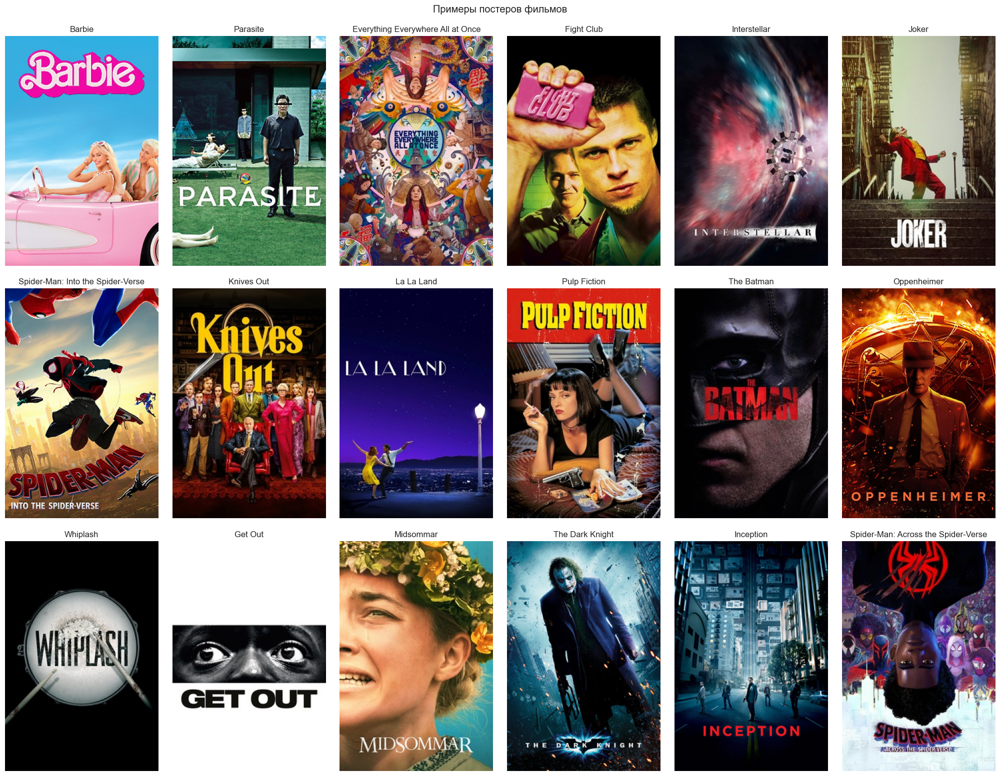

In [50]:
figure = plt.figure(
    layout='constrained',
    figsize=(20, 15)
)

grid = GridSpec(
    figure=figure,
    nrows=3,
    ncols=6,
    hspace=0.05,
    wspace=0.05,
)

figure.suptitle(
    t='Примеры постеров фильмов',
    y=1.025,
    fontsize='x-large'
)

for i in range(3):
    for j in range(6):
        figure.add_subplot(grid[i, j])

data = posters.head(18)

for i, path in enumerate(data):
    key = int(path.split('.')[0])
    name = df['movies'].loc[df['movies']['id'] == key, 'name'].iloc[0]
    
    figure.axes[i].set_title(
        label=name,
        fontsize='large',
        y=1.0
    )
    
    with cbook.get_sample_data(f'{FILE_RAW_PATH}/{folder}/posters/{path}') as file:
        image = plt.imread(file)
        figure.axes[i].imshow(image)
        
for i in range(18):
    figure.axes[i].set_xticks([])
    figure.axes[i].set_yticks([])
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)

## Выводы по предварительной обработке данных

1. Названия полей оставлены **без изменений**.
2. Измены типы данных:
    - для поля **date** в наборах **movie** и **releases** изменен тип данных на **datetime**;
    - для **числовых полей**, уменьшена точность до **32 бит**.
3. Удалено до **5000** явных дубликатов. 

# Разведочный анализ данных
***

## Анализ даты выхода фильмов

In [51]:
def line(data: pd.DataFrame, x: str, y: str, title: str, xlabel: str, ylabel: str):
    figure = plt.figure(
        layout="constrained",
        figsize=(20, 5)
    )
    
    figure.suptitle(
        t=title, 
        y=1.05, 
        fontsize='x-large'
    )
    
    figure.add_subplot()
    
    sns.lineplot(
        data=data,
        x=x,
        y=y,
        linewidth=2.0,
        marker='o',
        markersize=8,
        ax=figure.axes[0],
        color=sns.color_palette('hls', 15)[8]
    )
    
    figure.axes[0].set_xlabel(xlabel)
    figure.axes[0].set_ylabel(ylabel)
    figure.axes[0].set_xticks(
        ticks=data[x], 
        labels=data[x].map(str),
        rotation=65
    );
    s, maximum = plot.step(data[y].max())
    figure.axes[0].set_yticks(np.arange(0, maximum + 1, s))
    figure.axes[0].set_xbound(
        lower=data[x].min() - 0.5, 
        upper=data[x].max() + 0.5
    )
    
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[0].spines[s].set_visible(False)

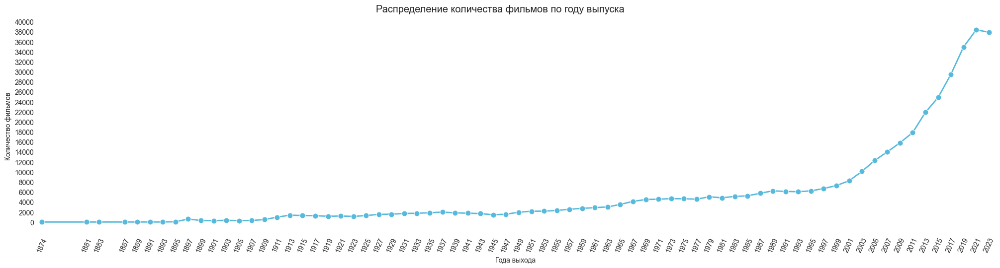

In [52]:
plot_data = df['movies'][df['movies']['date'].dt.year < 2024]
plot_data = (plot_data['date']
             .dt
             .year
             .astype('int32')
             .value_counts()
             .reset_index()
             .sort_values(by='date'))

plot_data = pd.concat([
    plot_data.iloc[[0], :],
    plot_data.iloc[slice(2, -2, 2), :],
    plot_data.iloc[[-1], :]
])

line(
    data=plot_data,
    x='date',
    y='count',
    title=('Распределение количества фильмов '
           'по году выпуска'),
    xlabel='Года выхода',
    ylabel='Количество фильмов'
)

**Первый фильм** выпущен в **1874** году. **Резкий подъем** количества выпущенных фильмов начинается в **2000** году и достигает свого **пика** в **2021** году (приблизительно **38 тыс.** фильмов).

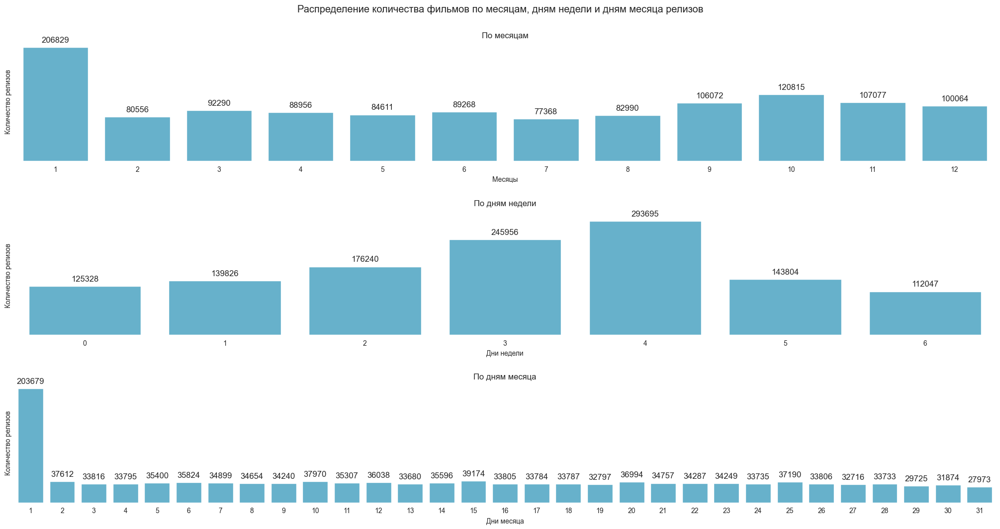

In [53]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 10)
)

figure.suptitle(
    t=('Распределение количества фильмов '
       'по месяцам, дням недели и дням месяца релизов'), 
    y=1.05, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=3, 
    ncols=1, 
    hspace=0.1
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[1, 0])
figure.add_subplot(grid[2, 0])

plot_data = (df['releases']['date']
             .dt.month
             .astype('int32')
             .value_counts()
             .sort_index()
             .reset_index())

sns.barplot(
    data=plot_data,
    x='date', 
    y='count', 
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_title(
    label='По месяцам',
    y=1,
    fontsize='large'
)
figure.axes[0].set_xlabel('Месяцы')
figure.axes[0].set_ylabel('Количество релизов')
figure.axes[0].set_yticks([])
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
)

plot_data = (df['releases']['date']
             .dt.weekday
             .astype('int32')
             .value_counts()
             .sort_index()
             .reset_index())

sns.barplot(
    data=plot_data,
    x='date', 
    y='count',
    ax=figure.axes[1],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[1].set_title(
    label='По дням недели',
    y=1.05,
    fontsize='large'
)
figure.axes[1].set_xlabel('Дни недели')
figure.axes[1].set_ylabel('Количество релизов')
figure.axes[1].set_yticks([])
figure.axes[1].bar_label(
    container=figure.axes[1].containers[0], 
    fontsize=12, 
    padding=5
)

plot_data = (df['releases']['date']
             .dt.day
             .astype('int32')
             .value_counts()
             .sort_index()
             .reset_index())

sns.barplot(
    data=plot_data,
    x='date', 
    y='count',
    ax=figure.axes[2], 
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[2].set_title(
    label='По дням месяца',
    y=1,
    fontsize='large'
)
figure.axes[2].set_xlabel('Дни месяца')
figure.axes[2].set_ylabel('Количество релизов')
figure.axes[2].set_yticks([])
figure.axes[2].bar_label(
    container=figure.axes[2].containers[0], 
    fontsize=12, 
    padding=5
)

for ax in range(3):
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[ax].spines[s].set_visible(False)

Наибольшее количество релизов проходит в **Январе**, **1 числа**, в **пятницу**.

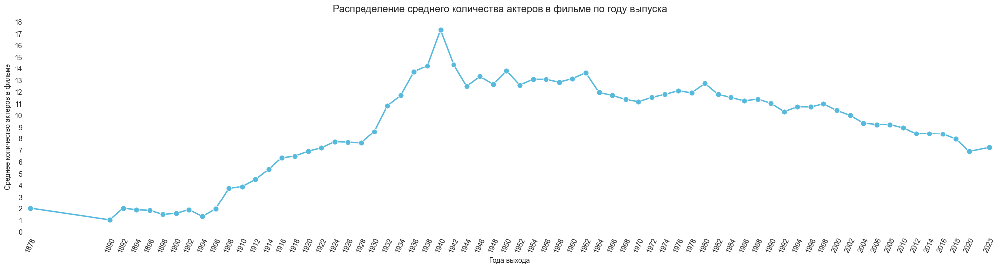

In [54]:
plot_data = df['actors'].join(df['movies'].set_index('id'), on='id', rsuffix='+')
plot_data = plot_data.loc[plot_data['date'].dt.year < 2024, ['id', 'date']]
plot_data['date'] = plot_data['date'].dt.year
plot_data = (plot_data
             .groupby(['date', 'id'])
             .value_counts()
             .groupby('date')
             .mean()
             .reset_index()
             .sort_values(by='date'))
plot_data = pd.concat([
    plot_data.iloc[[0], :],
    plot_data.iloc[slice(2, -2, 2), :],
    plot_data.iloc[[-1], :]
])
line(
    data=plot_data,
    x='date',
    y='count',
    title=('Распределение среднего количества актеров в фильме '
           'по году выпуска'),
    xlabel='Года выхода',
    ylabel='Среднее количество актеров в фильме'
)

Среднее количество актеров, снимавшихся в фильме достигло своего пика в **1940** году (более **15** актеров). С этого года среднее количество актеров, снимавшихся в фильме **снижается**. В **2023** году их количество составляет **менее 10**.

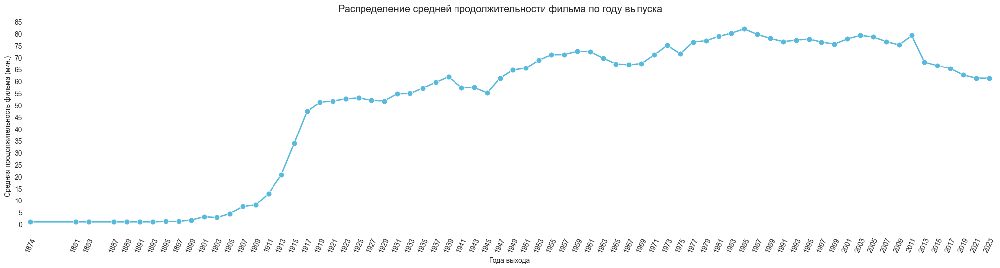

In [55]:
plot_data = df['movies'].loc[df['movies']['date'].dt.year < 2024, ['date', 'minute']]
plot_data['date'] = plot_data['date'].dt.year
plot_data = plot_data.groupby('date').mean().reset_index()
plot_data = pd.concat([
    plot_data.iloc[[0], :],
    plot_data.iloc[slice(2, -2, 2), :],
    plot_data.iloc[[-1], :]
])

line(
    data=plot_data,
    x='date',
    y='minute',
    title=('Распределение средней продолжительности фильма '
           'по году выпуска'),
    xlabel='Года выхода',
    ylabel='Средняя продолжительность фильма (мин.)'
)

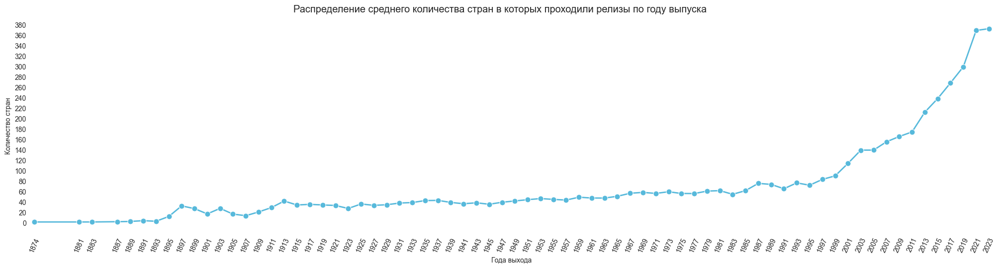

In [56]:
plot_data = df['releases'].join(df['movies'].set_index('id'), on='id', rsuffix='+')
plot_data = plot_data.loc[plot_data['date'].dt.year < 2024, ['country', 'date']]
plot_data['date'] = plot_data['date'].dt.year
plot_data = (plot_data
             .groupby(['date', 'country'])
             .value_counts()
             .groupby('date')
             .mean()
             .reset_index()
             .sort_values(by='date'))
plot_data = pd.concat([
    plot_data.iloc[[0], :],
    plot_data.iloc[slice(2, -2, 2), :],
    plot_data.iloc[[-1], :]
])
line(
    data=plot_data,
    x='date',
    y='count',
    title=('Распределение среднего количества стран '
           'в которых проходили релизы '
           'по году выпуска'),
    xlabel='Года выхода',
    ylabel='Количество стран'
)

In [57]:
def matrix(data: pd.DataFrame, title: str, xlabel: str, ylabel: str, width: float):
    figure = plt.figure(
        layout="constrained",
        figsize=(20, width)
    )

    figure.suptitle(
        t=title, 
        y=1.05, 
        fontsize='x-large'
    )
    
    grid = GridSpec(
        figure=figure,
        nrows=1, 
        ncols=2, 
        wspace=0.01,
        width_ratios=[1, 0.025]
    )
    
    figure.add_subplot(grid[0, 0])
    figure.add_subplot(grid[0, 1])
    
    s, maximum = plot.step(plot_data.max().max())
    
    sns.heatmap(
        data=data,
        linewidths=1.0,
        cmap=sns.color_palette("light:#57b9db", as_cmap=True),
        ax=figure.axes[0],
        cbar_ax=figure.axes[1],
        annot=True,
        fmt='d',
        mask=data == 0,
        cbar_kws={'ticklocation': 'left'},
        vmin=0,
        vmax=maximum
    )
    
    
    figure.axes[1].set_yticks(np.arange(0, maximum + 1, s))
    figure.axes[0].set_xlabel(xlabel)
    figure.axes[0].set_ylabel(ylabel)
    figure.axes[0].tick_params(axis='x', labelrotation=45.0)

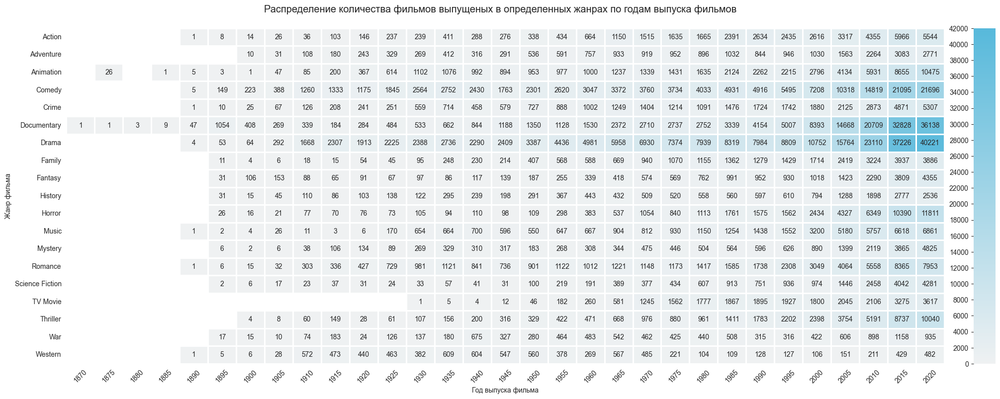

In [58]:
plot_data = (df['genres']
             .join(df['movies'][['id', 'date']].set_index('id'), on='id'))
plot_data['date'] = plot_data['date'].dt.year.apply(lambda x: x // 5 * 5)
plot_data = plot_data[plot_data['date'] < 2024]
plot_data['date'] = plot_data['date'].astype('int32')
plot_data = (plot_data
             .groupby('date')['genre']
             .value_counts()
             .unstack()
             .fillna(0)
             .astype('int32')
             .T)

matrix(
    data=plot_data,
    title=('Распределение количества фильмов '
           'выпущеных в определенных жанрах '
           'по годам выпуска фильмов'),
    xlabel='Год выпуска фильма',
    ylabel='Жанр фильма',
    width=7.5
)

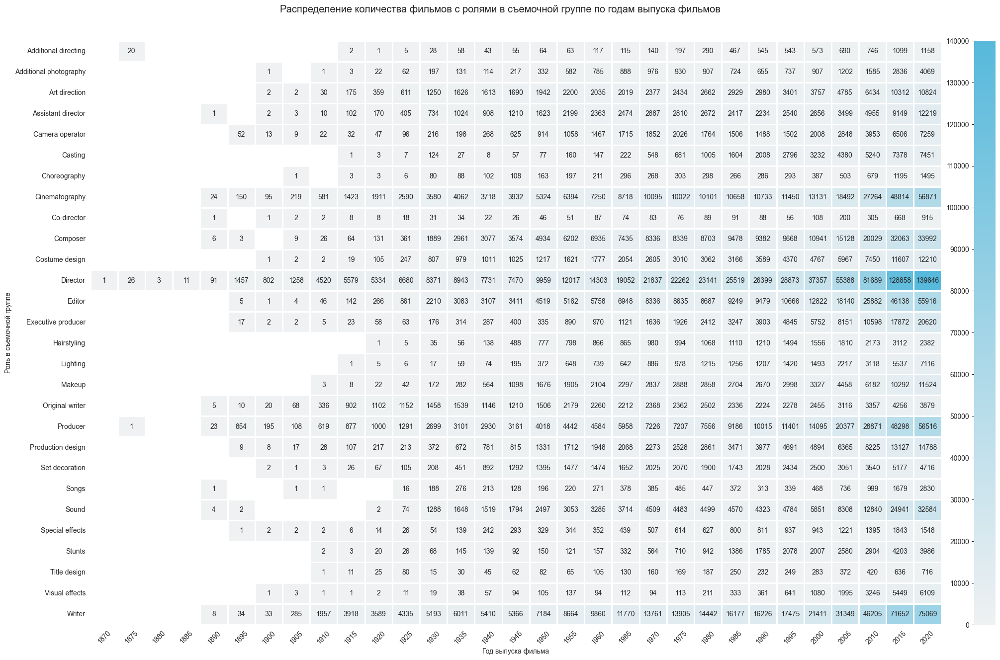

In [59]:
plot_data = (df['crew'][['id', 'role']]
             .join(df['movies'][['id', 'date']].set_index('id'), on='id'))
plot_data['date'] = plot_data['date'].dt.year.apply(lambda x: x // 5 * 5)
plot_data = plot_data[plot_data['date'] < 2024]
plot_data['date'] = plot_data['date'].astype('int32')
plot_data = (plot_data
             .drop_duplicates()
             .groupby('date')['role']
             .value_counts()
             .unstack()
             .fillna(0)
             .astype('int32')
             .T)

matrix(
    data=plot_data,
    title=('Распределение количества фильмов '
           'с ролями в съемочной группе '
           'по годам выпуска фильмов'),
    xlabel='Год выпуска фильма',
    ylabel='Роль в съемочной группе',
    width=12.5
)

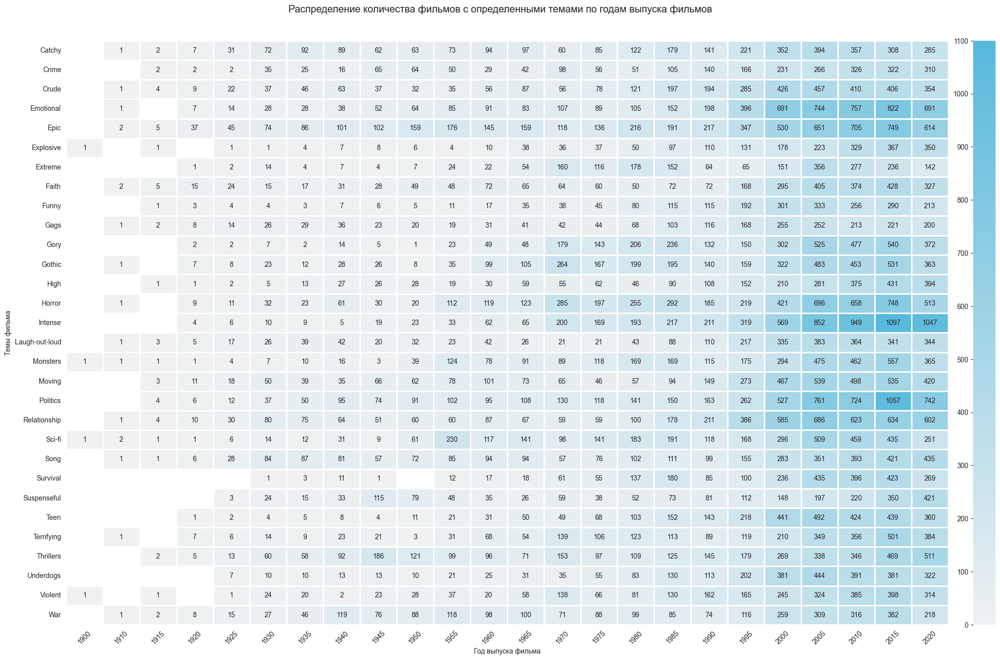

In [60]:
plot_data = (df['themes']
             .join(df['movies'][['id', 'date']].set_index('id'), on='id'))
plot_data['date'] = plot_data['date'].dt.year.apply(lambda x: x // 5 * 5)
plot_data = plot_data[plot_data['date'] < 2024]
plot_data['date'] = plot_data['date'].astype('int32')
plot_data['theme'] = plot_data['theme'].apply(lambda x: (x
                                                         .replace(',', '')
                                                         .split()[0]))
plot_data = plot_data[plot_data['theme'].isin(plot_data['theme'].value_counts().index[:30])]
plot_data = (plot_data
             .groupby('date')['theme']
             .value_counts()
             .unstack()
             .fillna(0)
             .astype('int32')
             .T)
matrix(
    data=plot_data,
    title=('Распределение количества фильмов '
           'с определенными темами '
           'по годам выпуска фильмов'),
    xlabel='Год выпуска фильма',
    ylabel='Темы фильма',
    width=12.5
)

## Анализ числовых данных

In [61]:
(df['movies'][['minute', 'rating']]
 .describe(percentiles=np.linspace(0.1, 0.9, 9))
 .style
 .format(lambda x: f'{x:.2f}'))

,minute,rating
count,707427.00,85552.00
mean,66.70,3.24
std,146.27,0.41
min,1.00,0.89
10%,6.00,2.70
20%,11.00,2.93
30%,20.00,3.09
40%,44.00,3.21
50%,65.00,3.30
60%,81.00,3.38


In [62]:
df['movies'][df['movies']['minute'] > 200].sort_values(by='minute', ascending=False)

,id,name,date,tagline,description,minute,rating
27798,1027799,Logistics,2011-01-01,NaN,Logistics or Logistics Art Project is an exper...,51420.0,3.30
447394,1447396,The Wait,2006-01-01,NaN,Events of the series take place in a poor neig...,49152.0,NaN
32882,1032883,Ambiancé,2020-01-01,Every frame counts,Space and time is intertwined into a surreal d...,43200.0,3.12
437079,1437081,Forgiveness,2011-01-01,NaN,"A love story between Azza and Amjad, whose hop...",40500.0,NaN
91590,1091591,Modern Times Forever,2011-01-01,NaN,"The film shows centuries of decay, compressed ...",14400.0,NaN
...,...,...,...,...,...,...,...
55665,1055666,Così fan tutte,2013-01-01,NaN,"Who loves whom in Così fan tutte, Mozart’s and...",201.0,NaN
383111,1383113,Exodus,2007-01-01,NaN,In 1945 Ada Sereni left her three children in ...,201.0,NaN
724399,1724389,Akweke,2016-01-01,NaN,"A noble daughter of the gods, who occupies a s...",201.0,NaN
894581,1894575,Singing Bird #1/2019 Concert by Request,2019-01-01,NaN,"Celebrate Thai pop icon Thongchai ""Bird"" McInt...",201.0,NaN


"**Логистика** или **Логистический арт-проект** — экспериментальный художественный фильм, продолжительностью 51 420 минут (857 часов или 35 дней и 17 часов). Это самый длинный фильм, когда-либо созданный. 37-дневное роуд-муви в прямом смысле этого слова. Работа посвящена Времени и Потреблению. Это выдвигает на передний план то, о чем часто забывают в нашем цифровом, якобы быстро меняющемся мире: медленные физические грузовые перевозки, которые лежат в основе нашей экономической реальности." - с сайта **[Letterboxd.com](https://letterboxd.com/film/logistics-2011)**.

Удалим данные о фиьмах, продолжительность которых более **200** минут.

In [63]:
ids = df['movies'].loc[df['movies']['minute'] > 200, 'id']

In [64]:
for name in df:
    df[name] = df[name][~df[name]['id'].isin(ids)]

In [65]:
(df['movies'][['minute', 'rating']]
 .describe(percentiles=np.linspace(0.1, 0.9, 9))
 .style
 .format(lambda x: f'{x:.2f}'))

,minute,rating
count,696233.00,83194.00
mean,59.00,3.23
std,42.55,0.41
min,1.00,0.89
10%,6.00,2.69
20%,11.00,2.92
30%,19.00,3.08
40%,42.00,3.20
50%,62.00,3.29
60%,80.00,3.37


Более **90%** фильмов имеют продолжительность менее **115 минут** и рейтинг менее **3.7**.

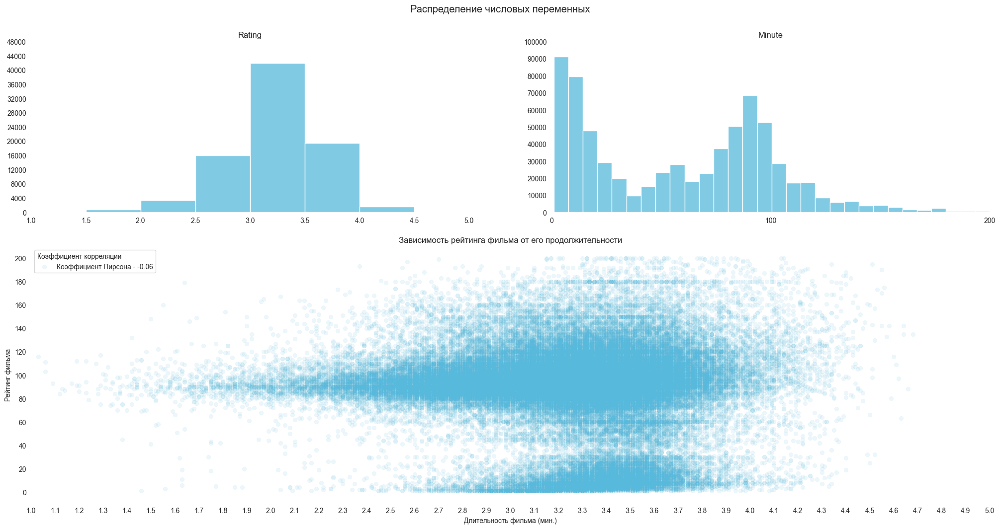

In [66]:
figure = plt.figure(
    layout="constrained", 
    figsize=(20, 10)
)

figure.suptitle(
    t='Распределение числовых переменных',
    y=1.05,
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure, 
    nrows=2, 
    ncols=2,  
    wspace=0.05,
    hspace=0.05,
    height_ratios=[1, 1.5]
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[0, 1])
figure.add_subplot(grid[1, :])

columns = ['rating', 'minute']

for i, column in enumerate(columns):
    bins = np.linspace(1.0, 5.0, 9) if not i else 30
    
    sns.histplot(
        x=df['movies'][column], 
        ax=figure.axes[i], 
        bins=bins,
        color=sns.color_palette('hls', 15)[8]
    )
        
    figure.axes[i].set_title(
        label=column.capitalize(),
        y=1,
        fontsize='large'
    )
    figure.axes[i].set_xlabel('')
    figure.axes[i].set_ylabel('')
    s, maximum = plot.step(figure.axes[i].get_yticks().max() - 1, 2)
    figure.axes[i].set_yticks(np.arange(0, maximum + 1, s))
    if i:
        figure.axes[i].set_xticks(np.arange(0, 201, 100))
        figure.axes[i].set_xbound(0, 200)
    else:
        figure.axes[0].set_xbound((1.0, 5.0))

sns.scatterplot(
    data=df['movies'][['rating', 'minute']],
    x='rating',
    y='minute',
    alpha=0.10,
    sizes=8,
    edgecolors=None,
    ax=figure.axes[2],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[2].set_title(
    label='Зависимость рейтинга фильма от его продолжительности',
    y=1,
    fontsize='large'
)

figure.axes[2].set_xticks(np.linspace(1.0, 5.0, 41))
figure.axes[2].set_xbound((1.0, 5.0))
s, maximum = plot.step(df['movies']['minute'].max() - 1, 2)
figure.axes[2].set_yticks(np.arange(0, maximum + 1, s))
figure.axes[2].set_xlabel('Длительность фильма (мин.)')
figure.axes[2].set_ylabel('Рейтинг фильма')

pirson = df['movies']['rating'].corr(df['movies']['minute'])
figure.axes[2].legend(
    title='Коэффициент корреляции',
    labels=[f'Коэффициент Пирсона - {pirson:.2f}'],
    loc='upper left', 
    alignment='left'
)

for i in range(3):
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)

Между рейтингом и продолжительностью кинофильма **отсутствует линейная зависимость**. Коэффициент корреляции Пирсона - **0.08**.

### Анализ рейтинга фильмов

Гистограмма показывает, что данные в полe **rating** подчиняются закону распределения, **близкому к нормальному**. Рассмотрим подробнее, как распределяются данные в этом поле. Для этого построим несколько диаграмм.

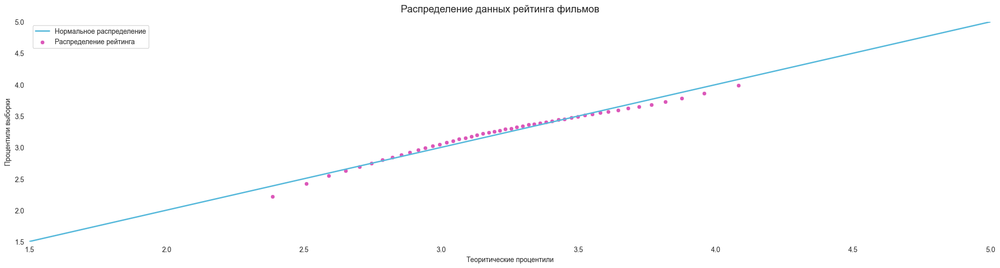

In [67]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Распределение данных рейтинга фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

rating_distribution = df['movies'].loc[df['movies']['rating'].notna(), 'rating']
normal_distribution = np.random.normal(
    loc=rating_distribution.mean(), 
    scale=rating_distribution.std(), 
    size=rating_distribution.size
)

percentiles = np.linspace(0, 100, 51)
rating = np.percentile(rating_distribution, percentiles)
normal = np.percentile(normal_distribution, percentiles)

sns.lineplot(
    x=normal, 
    y=normal,
    linewidth=2.0,
    ax=figure.axes[0], 
    label='Нормальное распределение', 
    color=sns.color_palette('hls', 15)[8]
)

sns.scatterplot(
    x=normal,
    y=rating,
    sizes=8,
    ax=figure.axes[0], 
    label='Распределение рейтинга', 
    color=sns.color_palette('hls', 15)[13]
)

figure.axes[0].set_xlabel('Теоритические процентили')
figure.axes[0].set_ylabel('Процентили выборки')
figure.axes[0].set_xbound((1.5, 5.0))
figure.axes[0].set_ybound((1.5, 5.0))
figure.axes[0].set_xticks(np.linspace(1.5, 5.0, 8))
figure.axes[0].set_yticks(np.linspace(1.5, 5.0, 8))
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].legend(alignment='left');

Распределение рейтинга фильмов (очень близко к **нормальному**.

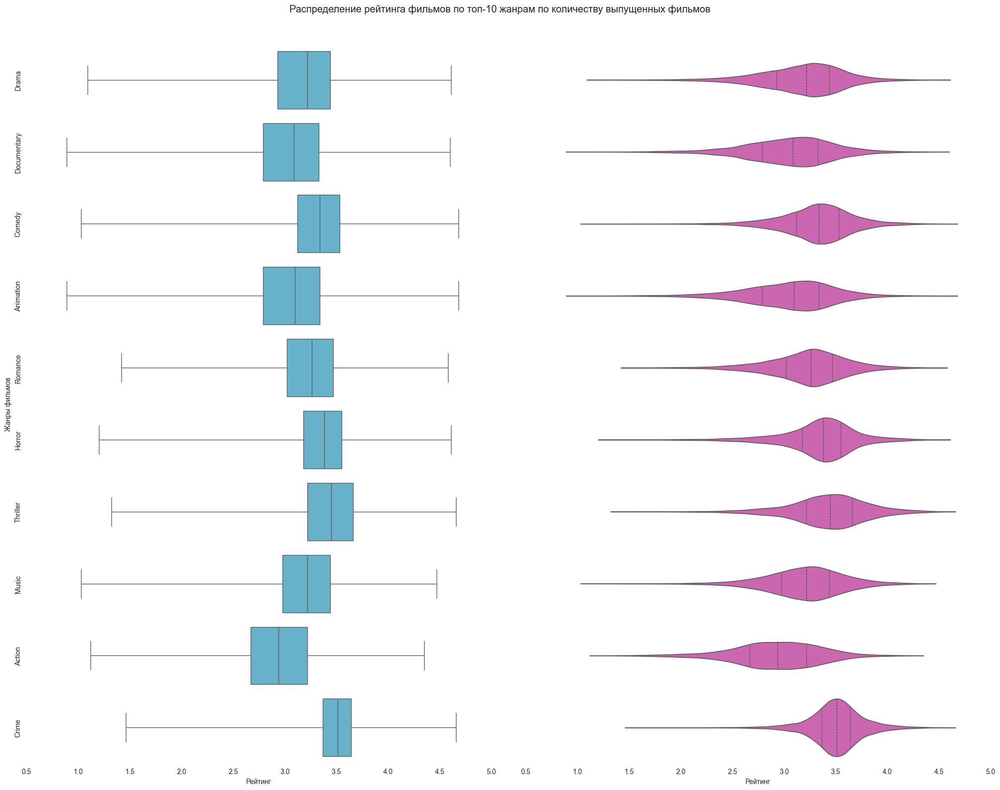

In [68]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 15)
)

figure.suptitle(
    t=('Распределение рейтинга фильмов '
       'по топ-10 жанрам по количеству выпущенных фильмов'), 
    y=1.05, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=1, 
    ncols=2, 
    wspace=0.05
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[0, 1])

genres = (df['genres']['genre']
          .value_counts()
          .iloc[:10])

plot_data = (df['genres']
             .join(df['movies'][['id', 'rating']].set_index('id'), on='id'))
plot_data = (plot_data
             .loc[plot_data['genre'].isin(genres.index), ['rating', 'genre']])

sns.boxplot(
    data=plot_data,
    x='rating',
    y='genre',
    whis=(0, 100),
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

sns.violinplot(
    data=plot_data,
    x='rating',
    y='genre',
    inner="quart",
    bw_adjust=1.0,
    cut=0.0,
    ax=figure.axes[1],
    color=sns.color_palette('hls', 15)[13]
)

for i in range(2):
    figure.axes[i].set_xlabel('Рейтинг')
    figure.axes[i].set_ylabel('Жанры фильмов' if not i else '')
    figure.axes[i].set_xbound((0.5, 5.0))
    figure.axes[i].set_xticks(np.linspace(0.5, 5.0, 10))
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)

figure.axes[0].set_yticks(
    ticks=np.arange(10), 
    labels=genres.index.map(str),
    rotation=90,
    verticalalignment='center'
)
figure.axes[1].set_yticklabels([]);

**Жанр кинофильма влияет** (было рассмотренно топ-10 жанров по количеству выпущенных фильмов) на распределение рейтинга фильмов.

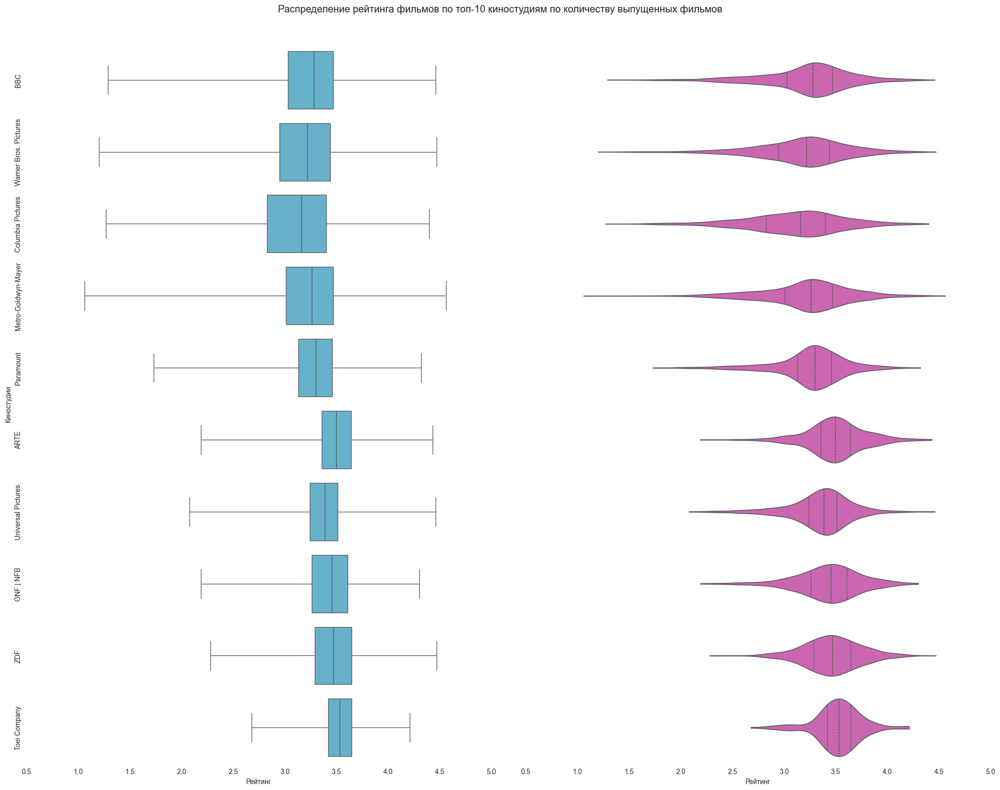

In [69]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 15)
)

figure.suptitle(
    t=('Распределение рейтинга фильмов '
       'по топ-10 киностудиям по количеству выпущенных фильмов'), 
    y=1.05, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=1, 
    ncols=2, 
    wspace=0.05
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[0, 1])

studios = (df['studios']['studio']
          .value_counts()
          .iloc[:10])

plot_data = (df['studios']
             .join(df['movies'][['id', 'rating']].set_index('id'), on='id'))
plot_data = (plot_data
             .loc[plot_data['studio'].isin(studios.index), ['rating', 'studio']])

sns.boxplot(
    data=plot_data,
    x='rating',
    y='studio',
    whis=(0, 100),
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

sns.violinplot(
    data=plot_data,
    x='rating',
    y='studio',
    inner="quart",
    bw_adjust=1.0,
    cut=0.0,
    ax=figure.axes[1],
    color=sns.color_palette('hls', 15)[13]
)

for i in range(2):
    figure.axes[i].set_xlabel('Рейтинг')
    figure.axes[i].set_ylabel('Киностудии' if not i else '')
    figure.axes[i].set_xbound((0.5, 5.0))
    figure.axes[i].set_xticks(np.linspace(0.5, 5.0, 10))
    for s in 'top', 'right', 'bottom', 'left':
        figure.axes[i].spines[s].set_visible(False)

figure.axes[0].set_yticks(
    ticks=np.arange(10), 
    labels=studios.index.map(str),
    rotation=90,
    verticalalignment='center'
)
figure.axes[1].set_yticklabels([]);

**Киностудия оказывает меньшее влияние** чем жанр (было рассмотренно топ-10 киностудий по количеству выпущенных фильмов) на распределение рейтинга фильмов.

## Анализ категориальных данных 

In [70]:
arrays = [[], []]
for name in df:
    columns = (df[name]
               .select_dtypes(include='object')).columns.to_list()
    arrays[0] += [name] * len(columns)
    arrays[1] += columns
columns = pd.MultiIndex.from_arrays(
    arrays=arrays,
    names=['Набор данных', 'Поля']
)

categories = pd.DataFrame(
    columns=columns,
    index=['count', 'unique', 'top', 'freq']
)

for name in df:
    values = (df[name]
             .select_dtypes(include='object')
             .describe())
    for column in values.columns:
        for index in categories.index:
            categories.loc[index, (name, column)] = values.loc[index, column]

categories

Набор данных     actors countries      crew                 genres languages  \
Поля               name   country      role           name   genre      type   
count           5384690    605320   4315274        4315274  972694    970569   
unique          1502598       247        28        1063532      19         3   
top           Mel Blanc       USA  Director  Louis Lumière   Drama  Language   
freq               1049    142342    832011           1170  214132    793573   

Набор данных           movies                                        releases  \
Поля         language    name          tagline           description  country   
count          970571  880531           129759                728601  1231252   
unique            188  750697           126459                713755      245   
top           English    Home  animation short  Mexican feature film      USA   
freq           447271     139              104                   903   304657   

Набор данных                     studios  \
Поля                type  rating  studio   
count            1231252  177125  627328   
unique                 6     249  151265   
top           Theatrical      NR     BBC   
freq              717081   40309    3246   

Набор данных                                   themes  
Поля                                            theme  
count                                          166487  
unique                                            109  
top           Horror, the undead and monster classics  
freq                                             4940

В наборе данных присутствует:
- более **240** стран выпустивших фильм;
- более **25** ролей в съемочной группе;
- **19** жанров;
- более **185** языков;
- более **240** стран, в которых проходили релизы фильмов;
- более **5** типов релизов;
- более **100** тем, на которые были сняты кинофильмы.

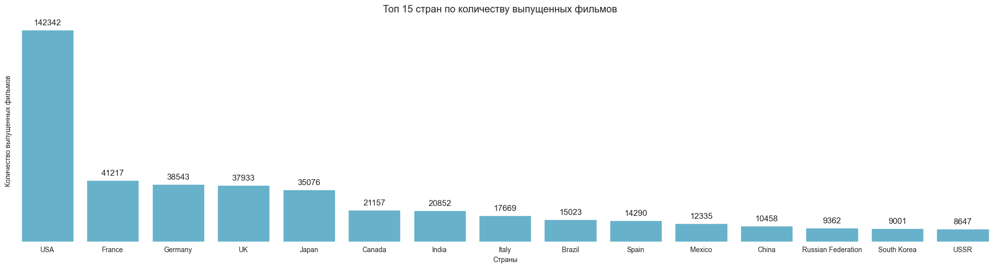

In [71]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 15 стран по количеству выпущенных фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['countries']['country']
             .value_counts()
             .iloc[:15])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Страны')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Наибольшее количество фильмов было выпущено в **USA** (более **140 тыс.** фильмов)

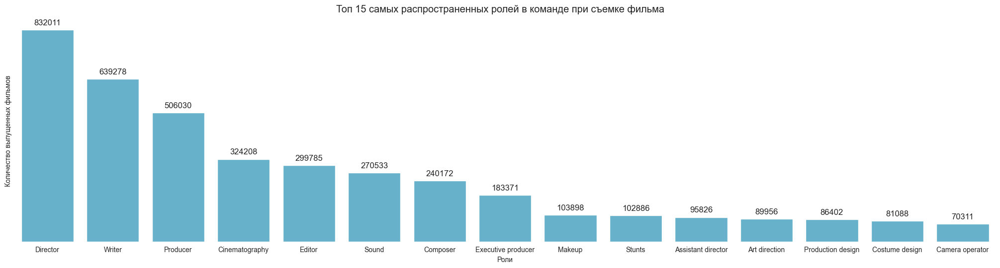

In [72]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 15 самых распространенных ролей в команде при съемке фильма', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['crew']['role']
             .value_counts()
             .iloc[:15])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Роли')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самая распространенная роль в съемочной группе - **Director**. Находился в съемочной группе при съемках более **845 тыс.** фильмов.

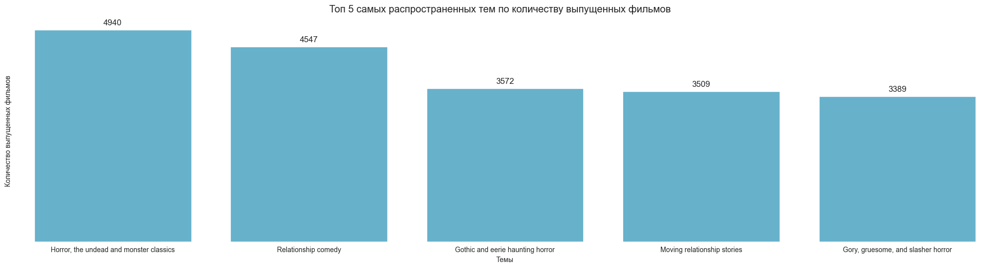

In [73]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 5 самых распространенных тем по количеству выпущенных фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['themes']['theme']
             .value_counts()
             .iloc[:5])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Темы')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самой распространенной темой, на которую был снят фильм - **Horror, the undead and monster classics** (приблизительно **5000** фильмов)

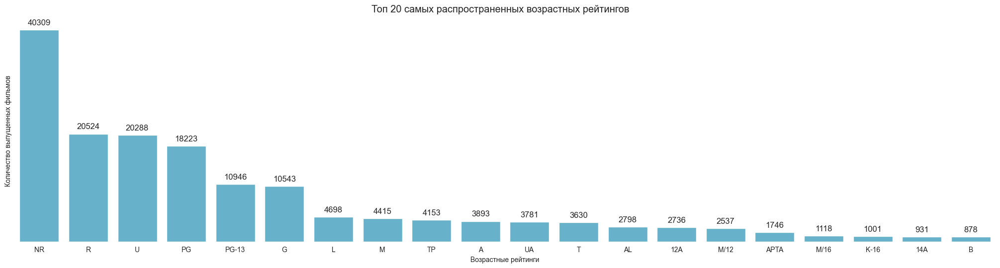

In [74]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 20 самых распространенных возрастных рейтингов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['releases']['rating']
             .value_counts()
             .iloc[:20])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Возрастные рейтинги')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самый распространенный возрастной рейтинг (**за исключением NR** - более **40 тыс.** фильмов) - **R**. С данным рейтингом было выпущено более **20 тыс**. фильмов.

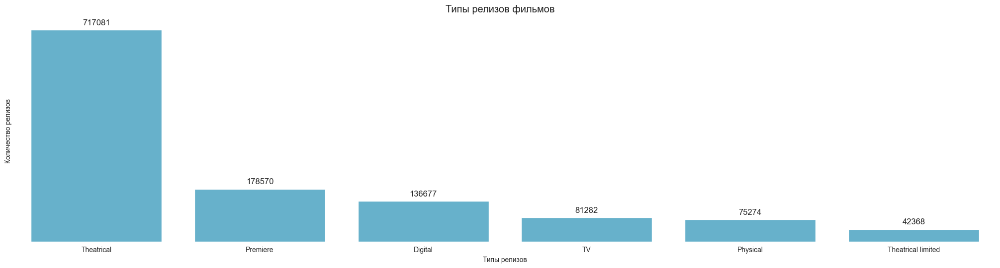

In [75]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Типы релизов фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['releases']['type']
             .value_counts())

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Типы релизов')
figure.axes[0].set_ylabel('Количество релизов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самый распространенный тип релиза - **Theatrical** (более **720 тыс**. фильмов).

### Жанры фильмов

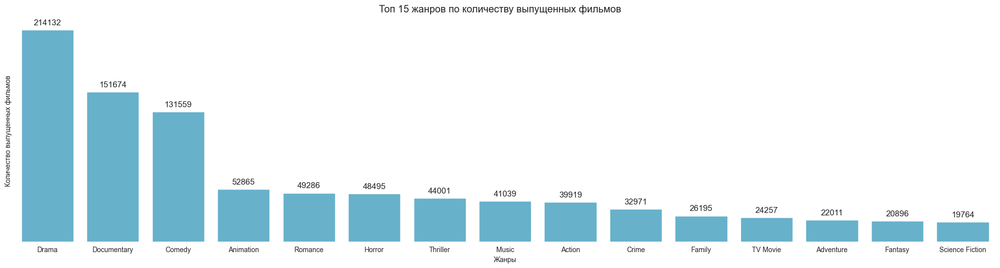

In [76]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 15 жанров по количеству выпущенных фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['genres']['genre']
             .value_counts()
             .iloc[:15])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Жанры')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самый распространенный жанр фильма - **Drama**. В данном жанры было снято более **215** тыс. фильмов.

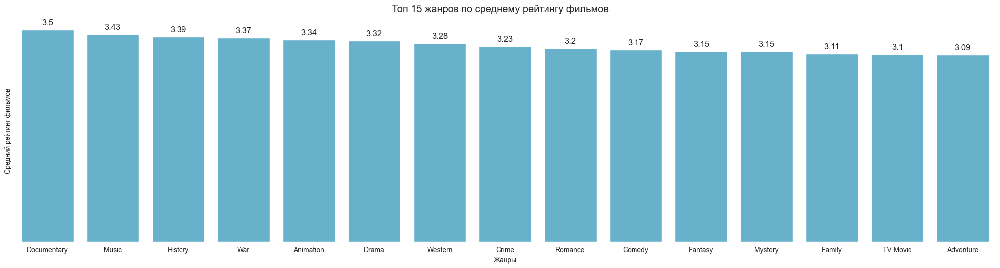

In [77]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 15 жанров по среднему рейтингу фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['genres']
             .join(df['movies'].set_index('id'), on='id')
             .groupby('genre')['rating']
             .mean()
             .sort_values(ascending=False)
             .round(2)
             .iloc[:15])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Жанры')
figure.axes[0].set_ylabel('Средний рейтинг фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Наибольший средний рейтинг имеют фильмы в жанре **Documentary** (более **3.5**).

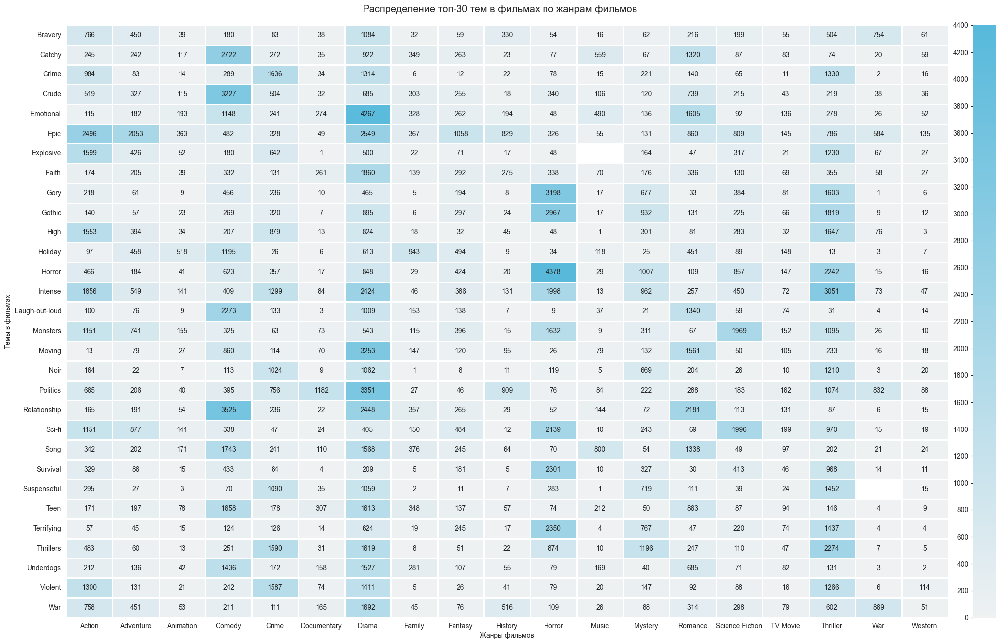

In [78]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 12.5)
)

figure.suptitle(
    t=('Распределение топ-30 тем в фильмах по жанрам фильмов'), 
    y=1.025, 
    fontsize='x-large'
)

grid = GridSpec(
    figure=figure,
    nrows=1, 
    ncols=2, 
    wspace=0.01,
    width_ratios=[1, 0.025]
)

figure.add_subplot(grid[0, 0])
figure.add_subplot(grid[0, 1])

plot_data = (df['genres']
             .join(df['themes'].set_index('id'), on='id')
             .dropna())
plot_data['theme'] = (plot_data['theme']
                      .apply(lambda x: x.replace(',', '').split()[0]))
plot_data = (plot_data[plot_data['theme']
             .isin(plot_data['theme'].value_counts().index[:30])])
plot_data = (plot_data
             .groupby('genre')['theme']
             .value_counts()
             .unstack()
             .fillna(0)
             .astype('int32')
             .T)



s, maximum = plot.step(plot_data.max().max())

sns.heatmap(
    data=plot_data,
    linewidths=1.0,
    cmap=sns.color_palette("light:#57b9db", as_cmap=True),
    ax=figure.axes[0],
    cbar_ax=figure.axes[1],
    cbar_kws={'ticklocation': 'left'},
    annot=True,
    fmt='d',
    mask=plot_data == 0,
    vmin=0,
    vmax=maximum
)

figure.axes[1].set_yticks(np.arange(0, maximum + 1, s))
figure.axes[0].set_xlabel('Жанры фильмов')
figure.axes[0].set_ylabel('Темы в фильмах');

### Киностудии

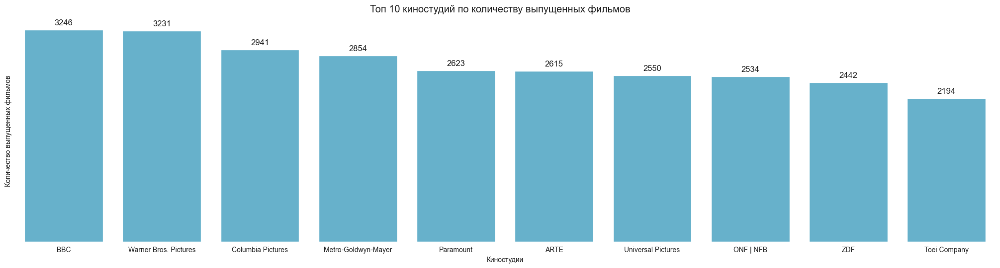

In [79]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 10 киностудий по количеству выпущенных фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['studios']['studio']
             .value_counts()
             .iloc[:10])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Киностудии')
figure.axes[0].set_ylabel('Количество выпущенных фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Самая распространенная киностудия - **Warner Bros. Pictures**. Данной киностудией было снято более **3400** фильмов.

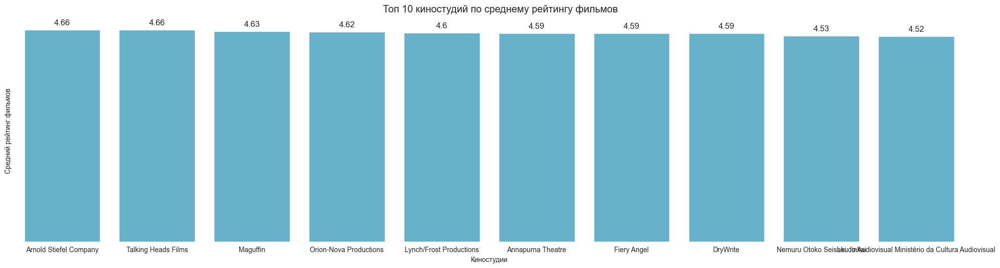

In [80]:
figure = plt.figure(
    layout="constrained",
    figsize=(20, 5)
)

figure.suptitle(
    t='Топ 10 киностудий по среднему рейтингу фильмов', 
    y=1.05, 
    fontsize='x-large'
)

figure.add_subplot()

plot_data = (df['studios']
             .join(df['movies'].set_index('id'), on='id')
             .groupby('studio')['rating']
             .mean()
             .sort_values(ascending=False)
             .round(2)
             .iloc[:10])

sns.barplot(
    data=plot_data,
    ax=figure.axes[0],
    color=sns.color_palette('hls', 15)[8]
)

figure.axes[0].set_xlabel('Киностудии')
figure.axes[0].set_ylabel('Средний рейтинг фильмов')
figure.axes[0].set_yticks([])
for s in 'top', 'right', 'bottom', 'left':
    figure.axes[0].spines[s].set_visible(False)
figure.axes[0].bar_label(
    container=figure.axes[0].containers[0], 
    fontsize=12, 
    padding=5
);

Наибольший средний рейтинг имеют кинофильмы, снятые киностудией **Arnold Stiefel Company** (более **4.65**).

# Выводы

**Выводы по предварительной обработке данных**.
1. Названия полей оставлены **без изменений**.
2. Измены типы данных:
    - для поля **date** в наборах **movie** и **releases** изменен тип данных на **datetime**;
    - для **числовых полей**, уменьшена точность до **32 бит**.
3. Удалено до **5000** вных дубликатов. 

**Выводы по разведочному анализу данных**:
1. Дата выпуска фильмов:
    - **первый фильм** выпущен в **1874** году. **Резкий подъем** количества выпущенных фильмов начинается в **2000** году и достигает свого **пика** в **2021** году (приблизительно **38 тыс.** фильмов);
    - наибольшее количество релизов проходит в **Январе**, **1 числа**, в **пятницу**;
    - среднее количество актеров, снимавшихся в фильме достигло своего пика в **1940** году (более **15** актеров). С этого года среднее количество актеров, снимавшихся в фильме **снижается**. В **2023** году их количество составляет **менее 10**.
2. Анализ числовых данных:
    - **Логистика** (**Логистический арт-проект**) — экспериментальный художественный фильм, продолжительностью 51 420 минут (857 часов или 35 дней и 17 часов). Это самый длинный фильм, когда-либо созданный;
    - более **90%** фильмов имеют продолжительность менее **115 минут** и рейтинг менее **3.7**;
    - между рейтингом и продолжительностью кинофильма **отсутствует линейная зависимость**. Коэффициент корреляции Пирсона - **0.08**.
    1. Анализ рейтинга фильмов:
        - распределение рейтинга фильмов (очень близко к **нормальному**;
        - **жанр кинофильма влияет** (было рассмотренно топ-10 жанров по количеству выпущенных фильмов) на распределение рейтинга фильмов;
        - **киностудия оказывает меньшее влияние** чем жанр (было рассмотренно топ-10 киностудий по количеству выпущенных фильмов) на распределение рейтинга фильмов.
2. Анализ категориальных данных:
    - в наборе данных присутствует:
        - более **240** стран выпустивших фильм;
        - более **25** ролей в съемочной группе;
        - **19** жанров;
        - более **185** языков;
        - более **240** стран, в которых проходили релизы фильмов;
        - более **5** типов релизов;
        - более **100** тем, на которые были сняты кинофильмы.
    - наибольшее количество фильмов было выпущено в **USA** (более **140 тыс.** фильмов);
    - самая распространенная роль в съемочной группе - **Director**. Находился в съемочной группе при съемках более **845 тыс.** фильмов;
    - самой распространенной темой, на которую был снят фильм - **Horror, the undead and monster classics** (более **5000** фильмов);
    - самый распространенный возрастной рейтинг (**за исключением NR** - более **40 тыс.** фильмов) - **R**. С данным рейтингом было выпущено более **20 тыс**. фильмов;
    - самый распространенный тип релиза - **Theatrical** (более **720 тыс**. фильмов).
    1. Жанры фильмов:
        - самый распространенный жанр фильма - **Drama**. В данном жанры было снято более **215** тыс. фильмов;
        - наибольший средний рейтинг имеют фильмы в жанре **Documentary** (более **3.5**).
    2. Киностудии:
        - самая распространенная киностудия - **Warner Bros. Pictures**. Данной киностудией было снято более **3400** фильмов;
        - наибольший средний рейтинг имеют кинофильмы, снятые киностудией **Arnold Stiefel Company** (более **4.65**).